1) Importation des modules et des fichiers csv nécessaires pour le projet

In [1]:
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib.patches import Patch
import matplotlib.pyplot as plt

from numpy.linalg import norm
from sklearn.impute import KNNImputer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import cosine_similarity
import secrets

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


In [2]:
df1 = 'asset/movies.csv'
df2 = 'asset/ratings.csv'

2) Ouverture des csv avec pandas

In [3]:
df1 = pd.read_csv(df1)
df2 = pd.read_csv(df2)


In [4]:
# Lecture du fichier contenant les films afin de connaître son contenu
df1.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [5]:
# Lecture du fichier contenant les notes des utilisateurs afin de connaître son contenu
df2.head()

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931


In [6]:
# Suppression de la colonne timestamp qui ne nous sert pas
df2 = df2.drop('timestamp', axis=1)

In [7]:
df2.head()

,userId,movieId,rating
0,1,1,4.0
1,1,3,4.0
2,1,6,4.0
3,1,47,5.0
4,1,50,5.0


In [8]:
# Création d'un dataset rassemblabnt les informations nécessaires 
merged_df = df2.merge(df1) 

In [9]:
merged_df.head()

,userId,movieId,rating,title,genres
0,1,1,4.0,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,1,3,4.0,Grumpier Old Men (1995),Comedy|Romance
2,1,6,4.0,Heat (1995),Action|Crime|Thriller
3,1,47,5.0,Seven (a.k.a. Se7en) (1995),Mystery|Thriller
4,1,50,5.0,"Usual Suspects, The (1995)",Crime|Mystery|Thriller


In [10]:
# ordre ascending
sorted_merged_df = merged_df.sort_values(by='userId', ascending=True) 

In [11]:
sorted_merged_df.head()

,userId,movieId,rating,title,genres
175,1,2648,4.0,Frankenstein (1931),Drama|Horror|Sci-Fi
174,1,2644,4.0,Dracula (1931),Horror
173,1,2641,5.0,Superman II (1980),Action|Sci-Fi
172,1,2640,4.0,Superman (1978),Action|Adventure|Sci-Fi
171,1,2628,4.0,Star Wars: Episode I - The Phantom Menace (1999),Action|Adventure|Sci-Fi


Calculer la similarité entre les utilisateurs et entre les films

In [12]:
df = sorted_merged_df

In [13]:
df.head()

,userId,movieId,rating,title,genres
175,1,2648,4.0,Frankenstein (1931),Drama|Horror|Sci-Fi
174,1,2644,4.0,Dracula (1931),Horror
173,1,2641,5.0,Superman II (1980),Action|Sci-Fi
172,1,2640,4.0,Superman (1978),Action|Adventure|Sci-Fi
171,1,2628,4.0,Star Wars: Episode I - The Phantom Menace (1999),Action|Adventure|Sci-Fi


In [14]:
# Création d'une pivot table 
df_matrix = df.pivot(index='userId', columns='movieId', values='rating')


 
- index: des lignes, représentent les utilisateurs

- columns: des colonnes, représentent les films

- values: des valeurs, représentent les évaluations


In [15]:
# On convertit en matrice Numpy pour pouvoir faire la similitude
df_matrix.to_numpy()

# On teste en remplaçant les valeurs vides par 2.5 "sans opinion"
df_matrix = df_matrix.fillna(2.5).values

In [16]:
''' 
n_users: number of users
'''

n_users = df_matrix.shape[0]

# Création d'une matrice zéro avec les dimensions égales aux nombres d'utilisateurs
similarity_matrix = np.zeros((n_users, n_users))


In [17]:
# On calcule la similaritude pour chaque utilisateurs entre eux 
for i in range(n_users):
    for j in range(n_users):
        if j != i: 
            similarity_matrix[i, j] = np.dot(df_matrix[i], df_matrix[j]) / (norm(df_matrix[i]) * norm(df_matrix[j]))  
                        
              

In [18]:
# Vérification du résultat
similarity_matrix

array([[0.        , 0.9920922 , 0.99125746, ..., 0.98545215, 0.99259735,
        0.9774378 ],
       [0.9920922 , 0.        , 0.99799025, ..., 0.98965485, 0.99912554,
        0.9819606 ],
       [0.99125746, 0.99799025, 0.        , ..., 0.98859472, 0.99839591,
        0.98079695],
       ...,
       [0.98545215, 0.98965485, 0.98859472, ..., 0.        , 0.99008087,
        0.97834401],
       [0.99259735, 0.99912554, 0.99839591, ..., 0.99008087, 0.        ,
        0.98188079],
       [0.9774378 , 0.9819606 , 0.98079695, ..., 0.97834401, 0.98188079,
        0.        ]])

In [19]:
# On le convertit en dataframe
similarity_df = pd.DataFrame(similarity_matrix)

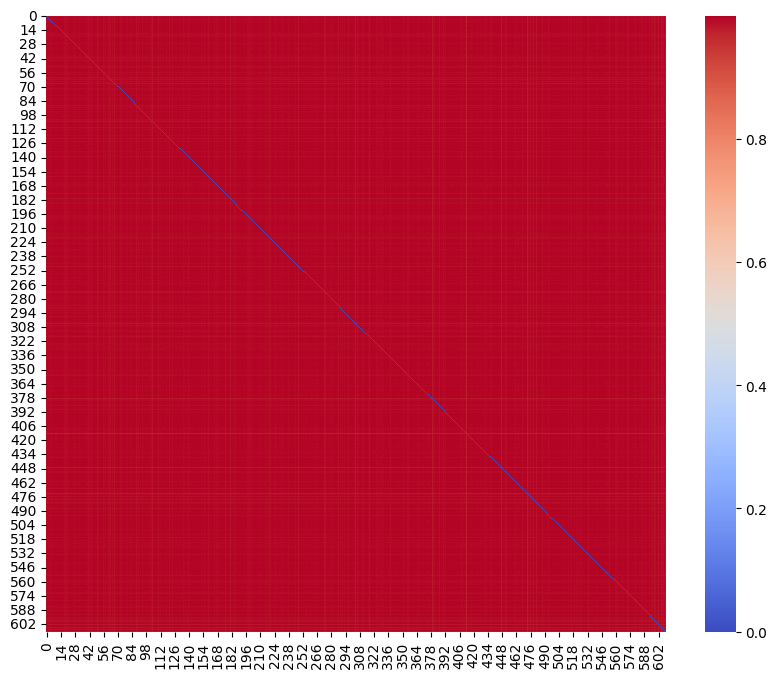

In [20]:
# Affichage de l'heatmap pour voir la concordance
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_df, cmap='coolwarm', annot=False)
plt.show()

* Movies

In [21]:
merged_df = df2.merge(df1) # Fusionner df1 avec df2
sorted_merged_df = merged_df.sort_values(by='userId', ascending=True) # Ordre ascending

In [22]:
sorted_merged_df.head()

,userId,movieId,rating,title,genres
175,1,2648,4.0,Frankenstein (1931),Drama|Horror|Sci-Fi
174,1,2644,4.0,Dracula (1931),Horror
173,1,2641,5.0,Superman II (1980),Action|Sci-Fi
172,1,2640,4.0,Superman (1978),Action|Adventure|Sci-Fi
171,1,2628,4.0,Star Wars: Episode I - The Phantom Menace (1999),Action|Adventure|Sci-Fi


In [23]:
# Charger le fichier CSV
data = sorted_merged_df

# Afficher les premières lignes du dataframe pour voir la structure des données
data.head()


,userId,movieId,rating,title,genres
175,1,2648,4.0,Frankenstein (1931),Drama|Horror|Sci-Fi
174,1,2644,4.0,Dracula (1931),Horror
173,1,2641,5.0,Superman II (1980),Action|Sci-Fi
172,1,2640,4.0,Superman (1978),Action|Adventure|Sci-Fi
171,1,2628,4.0,Star Wars: Episode I - The Phantom Menace (1999),Action|Adventure|Sci-Fi


In [24]:
# On calcule la moyenne de note par film pour faire un tri
avg_ratings = sorted_merged_df.groupby('title').agg(avg_ratings= ('rating', 'mean'),
                                                    number_of_ratings = ('rating', 'count')).reset_index()

In [25]:
avg_ratings.head()

,title,avg_ratings,number_of_ratings
0,'71 (2014),4.0,1
1,'Hellboy': The Seeds of Creation (2004),4.0,1
2,'Round Midnight (1986),3.5,2
3,'Salem's Lot (2004),5.0,1
4,'Til There Was You (1997),4.0,2


In [26]:
# On garde le nombre de note au dessus de 100
avg_ratings100 = avg_ratings[avg_ratings['number_of_ratings']>100]

In [27]:
avg_ratings100.sort_values(by='number_of_ratings', ascending=False)

,title,avg_ratings,number_of_ratings
3158,Forrest Gump (1994),4.164134,329
7593,"Shawshank Redemption, The (1994)",4.429022,317
6865,Pulp Fiction (1994),4.197068,307
7680,"Silence of the Lambs, The (1991)",4.161290,279
5512,"Matrix, The (1999)",4.192446,278
...,...,...,...
3845,Heat (1995),3.946078,102
8885,Trainspotting (1996),4.039216,102
1833,Cliffhanger (1993),3.034653,101
3048,"Firm, The (1993)",3.534653,101


In [28]:
# On rassemble le dataframe avec les titres, films, ...  avec l'average en filtrant pour n'avoir que les films avec au moins une centaine de notes
merged_df = pd.merge(sorted_merged_df, avg_ratings100[['title']], on='title', how='inner')

In [29]:
merged_df.head()

,userId,movieId,rating,title,genres
0,1,2628,4.0,Star Wars: Episode I - The Phantom Menace (1999),Action|Adventure|Sci-Fi
1,1,2571,5.0,"Matrix, The (1999)",Action|Sci-Fi|Thriller
2,1,50,5.0,"Usual Suspects, The (1995)",Crime|Mystery|Thriller
3,1,2028,4.0,Saving Private Ryan (1998),Action|Drama|War
4,1,223,3.0,Clerks (1994),Comedy


In [30]:
# On créer une nouvelle pivot table 
merged_ratings_pivot = pd.pivot_table(merged_df, index='userId', columns='title', values='rating')

In [31]:
# On remplace le vide par 0
merged_ratings_pivot = merged_ratings_pivot.fillna(0)

In [32]:
merged_ratings_pivot.head()

title,2001: A Space Odyssey (1968),Ace Ventura: Pet Detective (1994),Aladdin (1992),Alien (1979),Aliens (1986),"Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001)",American Beauty (1999),American History X (1998),American Pie (1999),Apocalypse Now (1979),...,True Lies (1994),"Truman Show, The (1998)",Twelve Monkeys (a.k.a. 12 Monkeys) (1995),Twister (1996),Up (2009),"Usual Suspects, The (1995)",WALL·E (2008),Waterworld (1995),Willy Wonka & the Chocolate Factory (1971),X-Men (2000)
userId,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,4.0,0.0,0.0,5.0,5.0,0.0,4.0,...,0.0,0.0,0.0,3.0,0.0,5.0,0.0,0.0,5.0,5.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,4.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0
5,0.0,3.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0


In [33]:
# Fobnction de sklearn qui fait le calcul fait plus tôt à la main (pour la similaritude)
similarity_matrix = cosine_similarity(merged_ratings_pivot)

In [34]:
similarity_matrix

array([[1.        , 0.05629628, 0.14994004, ..., 0.62080052, 0.24686689,
        0.60694251],
       [0.05629628, 1.        , 0.        , ..., 0.15609306, 0.0730121 ,
        0.22264665],
       [0.14994004, 0.        , 1.        , ..., 0.10116861, 0.        ,
        0.08040667],
       ...,
       [0.62080052, 0.15609306, 0.10116861, ..., 1.        , 0.32461045,
        0.81506098],
       [0.24686689, 0.0730121 , 0.        , ..., 0.32461045, 1.        ,
        0.21741446],
       [0.60694251, 0.22264665, 0.08040667, ..., 0.81506098, 0.21741446,
        1.        ]])

In [35]:
# Transformation en DataFrame
similarity_matrix_df = pd.DataFrame(similarity_matrix, index=merged_ratings_pivot.index, columns=merged_ratings_pivot.index)

In [36]:
similarity_matrix_df.head()

userId,1,2,3,4,5,6,7,8,9,10,...,601,602,603,604,605,606,607,608,609,610
userId,,,,,,,,,,,,,,,,,,,,,
1,1.000000,0.056296,0.149940,0.502701,0.317641,0.360316,0.364989,0.292416,0.161828,0.094330,...,0.258653,0.416659,0.646653,0.185122,0.304023,0.595505,0.565108,0.620801,0.246867,0.606943
2,0.056296,1.000000,0.000000,0.019890,0.046363,0.050349,0.035701,0.061566,0.000000,0.227727,...,0.310043,0.051480,0.084336,0.000000,0.000000,0.189484,0.049686,0.156093,0.073012,0.222647
3,0.149940,0.000000,1.000000,0.000000,0.274411,0.107280,0.000000,0.218635,0.000000,0.000000,...,0.177109,0.182818,0.091372,0.000000,0.000000,0.131511,0.176446,0.101169,0.000000,0.080407
4,0.502701,0.019890,0.000000,1.000000,0.198991,0.230690,0.308946,0.146191,0.061477,0.080363,...,0.187644,0.254814,0.533513,0.139434,0.264859,0.377129,0.360590,0.471025,0.073255,0.441904
5,0.317641,0.046363,0.274411,0.198991,1.000000,0.624101,0.211875,0.614356,0.000000,0.115703,...,0.147746,0.622074,0.287508,0.498556,0.387118,0.253337,0.364109,0.390052,0.466030,0.261621


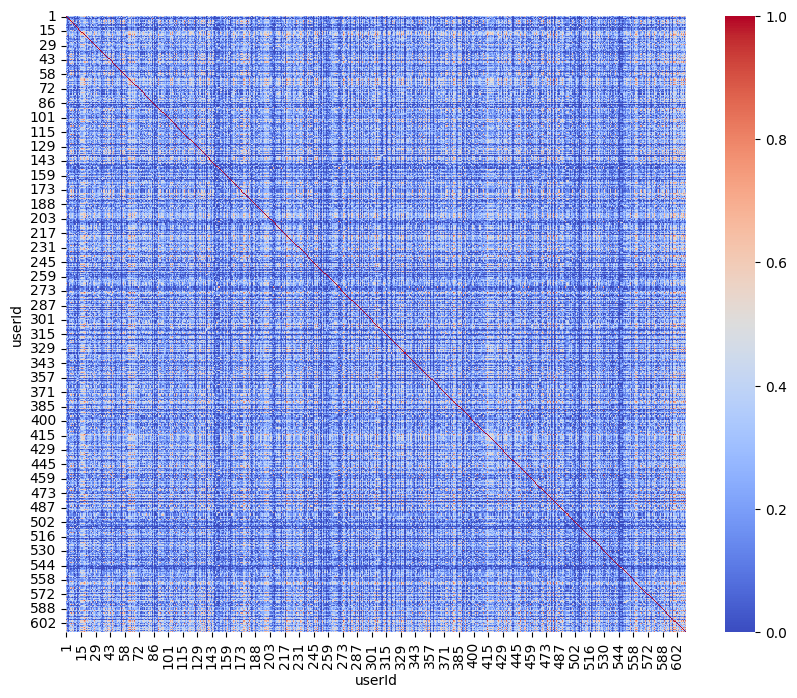

In [37]:
# Affichage dans une heatmap

plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix_df, cmap='coolwarm', annot=False)
plt.show()

In [38]:
df = merged_df  

In [39]:
# Matrice utilisateur-film
df_matrix = df.pivot_table(index='userId', columns='title', values='rating')

Test final

In [40]:
''' 
ex: l'utilisateur 1 n'a pas noté le film X. 
KNNImputer va chercher les 5 utilisateurs qui ont des profils de notation similaires à l'utilisateur 1 
(en fonction des autres films qu'ils ont tous notés) 
et va estimer la note que l'utilisateur 1 aurait pu donner à X 
en utilisant les notes des 5 utilisateurs les plus similaires.
'''

#  valeurs manquantes avec KNNImputer
imputer = KNNImputer(n_neighbors=5)
df_matrix_imputed = imputer.fit_transform(df_matrix)

In [41]:
df_matrix_imputed = pd.DataFrame(df_matrix_imputed, index=df_matrix.index, columns=df_matrix.columns) # Dataframe

1. Similarité entre utilisateurs

In [42]:
user_similarity = cosine_similarity(df_matrix_imputed)
user_similarity_df = pd.DataFrame(user_similarity, index=df_matrix.index, columns=df_matrix.index)

In [43]:
user_similarity_df.head()

userId,1,2,3,4,5,6,7,8,9,10,...,601,602,603,604,605,606,607,608,609,610
userId,,,,,,,,,,,,,,,,,,,,,
1,1.000000,0.986581,0.981171,0.975819,0.985443,0.977210,0.976356,0.985954,0.986978,0.971420,...,0.988674,0.982090,0.967051,0.985040,0.987417,0.984478,0.980424,0.974779,0.989535,0.985342
2,0.986581,1.000000,0.982728,0.971413,0.988499,0.980987,0.980146,0.987028,0.989832,0.975886,...,0.989090,0.981652,0.968152,0.988558,0.987509,0.982499,0.980877,0.978221,0.989010,0.988351
3,0.981171,0.982728,1.000000,0.967741,0.975683,0.977821,0.974356,0.978602,0.981512,0.966853,...,0.980000,0.972411,0.967658,0.979453,0.982619,0.977249,0.974152,0.971037,0.983708,0.980856
4,0.975819,0.971413,0.967741,1.000000,0.964114,0.968739,0.968134,0.970756,0.970320,0.971228,...,0.973703,0.969460,0.955504,0.969405,0.980894,0.968793,0.967352,0.953978,0.972191,0.969315
5,0.985443,0.988499,0.975683,0.964114,1.000000,0.975112,0.976659,0.981611,0.984557,0.963205,...,0.986949,0.978358,0.965990,0.984766,0.981236,0.982212,0.980055,0.976941,0.987672,0.983594


2. Similarité entre les films

In [44]:
movie_similarity = cosine_similarity(df_matrix_imputed.T)
movie_similarity_df = pd.DataFrame(movie_similarity, index=df_matrix.columns, columns=df_matrix.columns)

In [45]:
movie_similarity_df.head()

title,2001: A Space Odyssey (1968),Ace Ventura: Pet Detective (1994),Aladdin (1992),Alien (1979),Aliens (1986),"Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001)",American Beauty (1999),American History X (1998),American Pie (1999),Apocalypse Now (1979),...,True Lies (1994),"Truman Show, The (1998)",Twelve Monkeys (a.k.a. 12 Monkeys) (1995),Twister (1996),Up (2009),"Usual Suspects, The (1995)",WALL·E (2008),Waterworld (1995),Willy Wonka & the Chocolate Factory (1971),X-Men (2000)
title,,,,,,,,,,,,,,,,,,,,,
2001: A Space Odyssey (1968),1.000000,0.964871,0.978575,0.981833,0.983141,0.983263,0.976576,0.985423,0.974814,0.986575,...,0.974020,0.981809,0.980041,0.971110,0.983373,0.982873,0.982827,0.968468,0.979272,0.979909
Ace Ventura: Pet Detective (1994),0.964871,1.000000,0.971307,0.967150,0.966611,0.969024,0.964098,0.973837,0.966510,0.973039,...,0.967783,0.972012,0.968399,0.964511,0.972201,0.969676,0.973127,0.964571,0.967679,0.969041
Aladdin (1992),0.978575,0.971307,1.000000,0.979657,0.979957,0.983438,0.978176,0.986406,0.981229,0.984631,...,0.981565,0.986479,0.979047,0.975530,0.984649,0.982664,0.983208,0.974420,0.981932,0.982118
Alien (1979),0.981833,0.967150,0.979657,1.000000,0.988862,0.985915,0.980488,0.986960,0.978096,0.987331,...,0.978202,0.984052,0.982600,0.972494,0.983934,0.985083,0.985013,0.973410,0.979990,0.981705
Aliens (1986),0.983141,0.966611,0.979957,0.988862,1.000000,0.985533,0.978766,0.986630,0.979023,0.986470,...,0.978380,0.983913,0.981925,0.973980,0.984596,0.983293,0.984275,0.974486,0.980336,0.982392


3. Prédiction

Visualisations

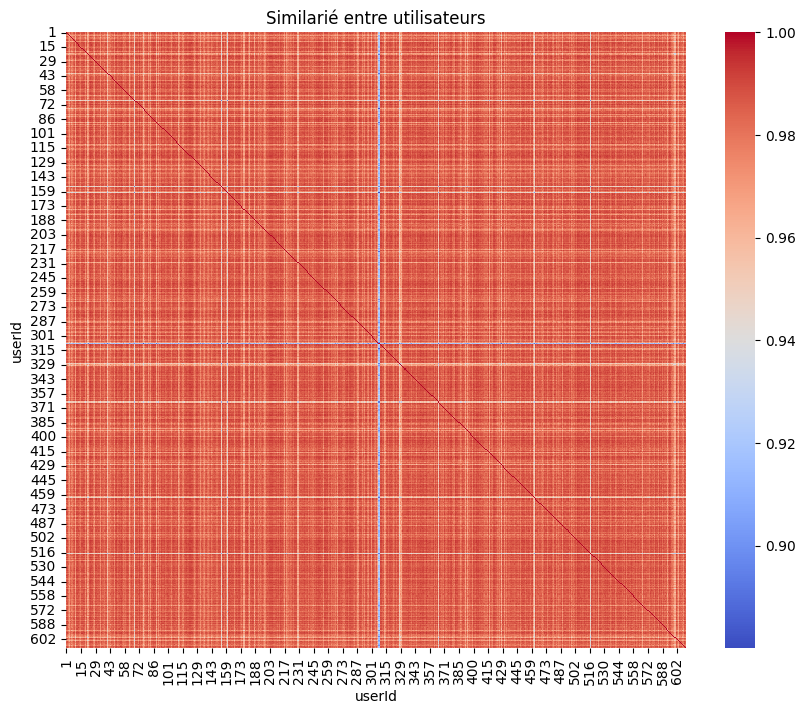

In [46]:
plt.figure(figsize=(10, 8))
sns.heatmap(user_similarity_df, cmap='coolwarm', annot=False)
plt.title('Similarié entre utilisateurs')
plt.show()

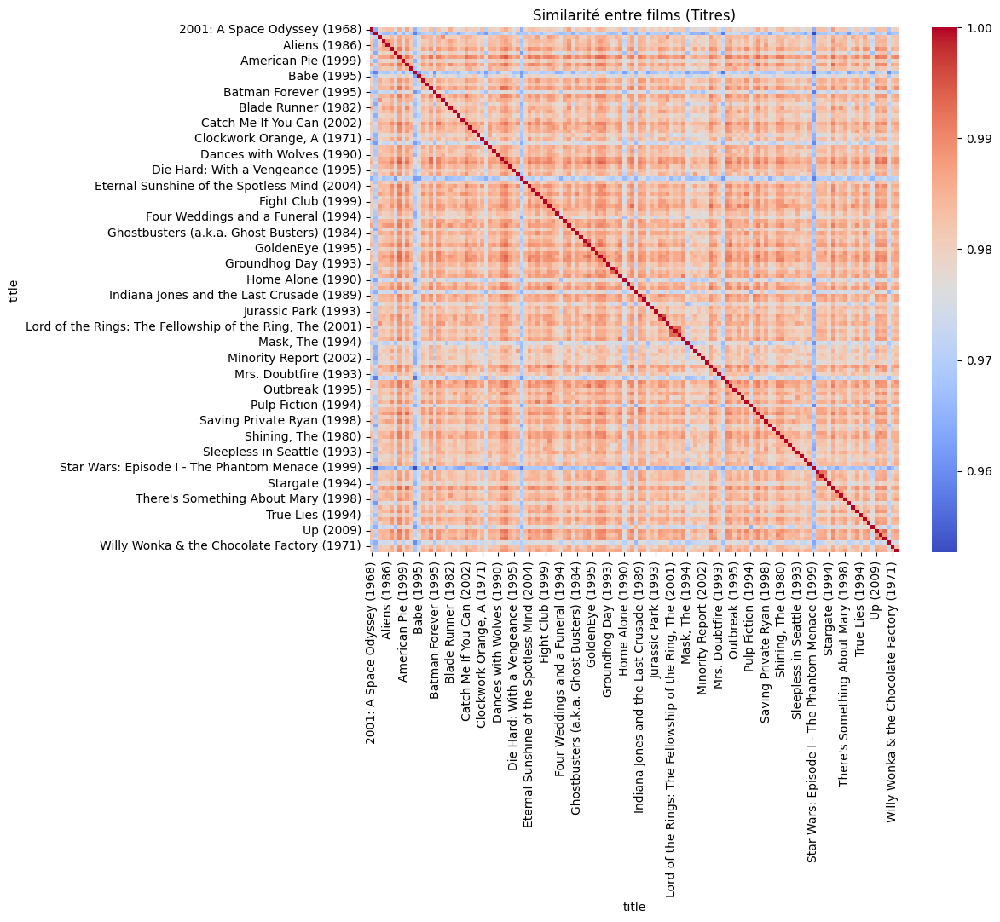

In [47]:
plt.figure(figsize=(10, 8))
sns.heatmap(movie_similarity_df, cmap='coolwarm', annot=False)
plt.title('Similarité entre films (Titres)')
plt.show()

In [48]:
df_genres = df['genres'].str.get_dummies(sep='|')
corr_matrix = df_genres.corr()


In [49]:
df_genres.head()

,Action,Adventure,Animation,Children,Comedy,Crime,Drama,Fantasy,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
2,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [50]:
df_genres.sum()


Action       8431
Adventure    7233
Animation    1493
Children     2195
Comedy       5741
Crime        4985
Drama        7837
Fantasy      2622
Horror        948
IMAX          927
Musical       620
Mystery      1699
Romance      3246
Sci-Fi       4818
Thriller     6662
War          1286
Western       164
dtype: int64

In [51]:
df_genres.shape[1]

17

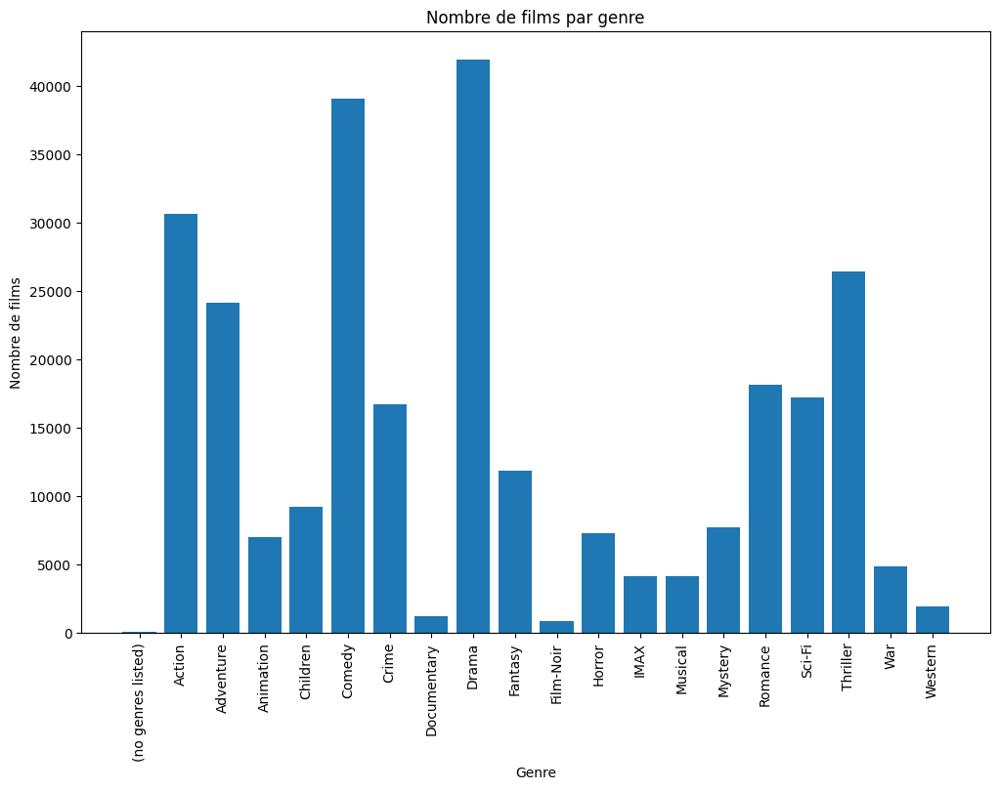

In [52]:
# Graphique permettant de voir quels genres sont les plus présents dans notre échantillon de films 
genres = ['(no genres listed)', 'Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'IMAX', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western']
counts = [47, 30635, 24161, 6988, 9208, 39053, 16681, 1219, 41928, 11834, 870, 7291, 4145, 4138, 7674, 18124, 17243, 26452, 4859, 1930]


plt.figure(figsize=(12, 8))
plt.bar(genres, counts)
plt.xticks(rotation=90)

plt.title('Nombre de films par genre')
plt.xlabel('Genre')
plt.ylabel('Nombre de films')
plt.show()


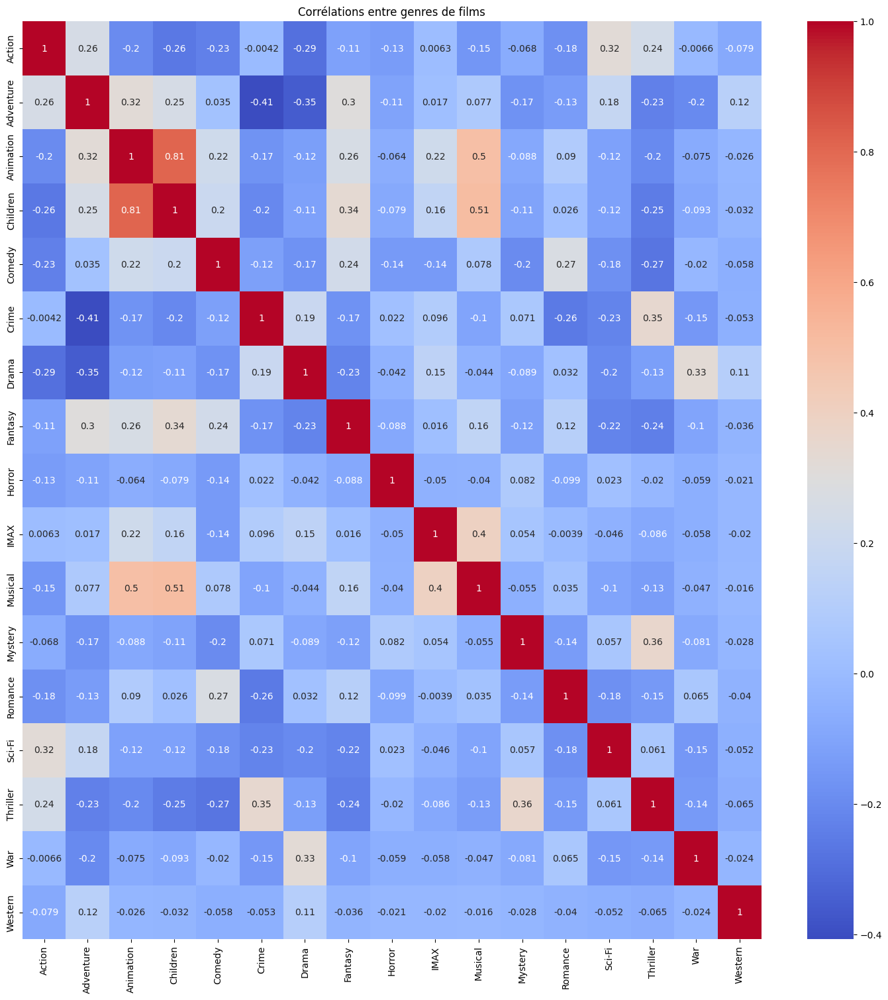

In [53]:
# Heatmap des corrélations entre genres
plt.figure(figsize=(18, 18))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Corrélations entre genres de films')
plt.show()


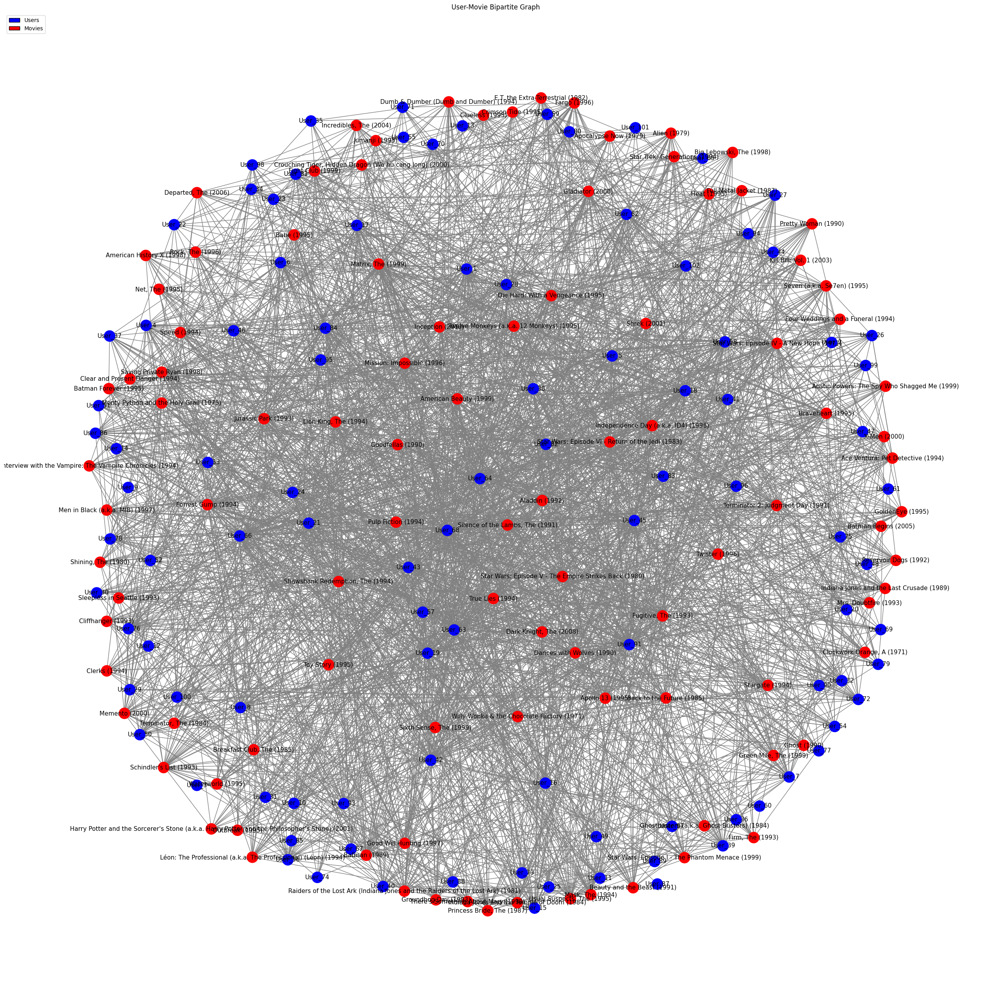

In [54]:
# Sélectionner un nombre limité d'utilisateurs et de films
users = df['userId'].unique()[:100]
movies = df['title'].unique()[:100]

# graphe bipartite
B = nx.Graph()
B.add_nodes_from(users, bipartite=0)  
B.add_nodes_from(movies, bipartite=1)  

# arêtes entre les utilisateurs et les films
edges = [(row['userId'], row['title']) for _, row in df.iterrows() 
         if row['userId'] in users and row['title'] in movies]
B.add_edges_from(edges)


pos = nx.spring_layout(B,k=2, seed=42)

# bleu pour les utilisateurs, rouge pour les films
color_map = ["blue" if node in users else "red" for node in B.nodes()]

# "User_" devant les identifiants des utilisateurs
labels = {node: f"User_{node}" if node in users else node for node in B.nodes()}
legend_elements = [Patch(facecolor='blue', edgecolor='black', label='Users'),
                   Patch(facecolor='red', edgecolor='black', label='Movies')]


plt.figure(figsize=(25, 25))
nx.draw(B, pos, labels=labels, node_color=color_map, with_labels=True, node_size=400, font_size=11, edge_color="gray")
plt.title("User-Movie Bipartite Graph")
plt.legend(handles=legend_elements,loc=2, prop={'size':10})
plt.show()


User_based et Item_base

In [55]:
users=range(1, 611)
users

range(1, 611)

In [56]:
movies=list(movie_similarity_df.columns)

In [57]:
print(secrets.choice(range(1, 611)))

132


In [58]:
print(secrets.choice(movies))

Star Trek: Generations (1994)


In [59]:
# Fonction pour prédire la note d'un film pour un utilisateur en utilisant le filtrage collaboratif basé sur les utilisateurs
def predict_user_based(user_id, movie_title, df_matrix_imputed, user_similarity_df, k=5):
    # K utilisateurs les plus similaires
    similar_users = user_similarity_df[user_id].sort_values(ascending=False)[1:k+1]
    
    # note prédite en prenant la moyenne pondérée
    user_ratings = df_matrix_imputed.loc[similar_users.index, movie_title]
    prediction = np.dot(similar_users, user_ratings) / np.sum(similar_users)
    
    return prediction

In [60]:
user_id = secrets.choice(users)
movie_title = secrets.choice(movies)

user_based_prediction = predict_user_based(user_id, movie_title, df_matrix_imputed, user_similarity_df)
print(f"Prédiction User-Based pour l'utilisateur {user_id} et le film '{movie_title}': {user_based_prediction}")

Prédiction User-Based pour l'utilisateur 184 et le film 'Apocalypse Now (1979)': 4.400016171787196


In [61]:
# Fonction pour prédire la note d'un film pour un utilisateur en utilisant le filtrage collaboratif basé sur les items
def predict_item_based(user_id, movie_title, df_matrix_imputed, movie_similarity_df, k=5):
    # K films les plus similaires
    similar_movies = movie_similarity_df[movie_title].sort_values(ascending=False)[1:k+1]
    
    movie_ratings = df_matrix_imputed.loc[user_id, similar_movies.index]
    prediction = np.dot(similar_movies, movie_ratings) / np.sum(similar_movies)
    
    return prediction

In [62]:
user_id = secrets.choice(users)
movie_title = secrets.choice(movies)

item_based_prediction = predict_item_based(user_id, movie_title, df_matrix_imputed, movie_similarity_df)
print(f"Prédiction Item-Based pour l'utilisateur {user_id} et le film '{movie_title}': {item_based_prediction}")

Prédiction Item-Based pour l'utilisateur 16 et le film 'Matrix, The (1999)': 3.6599601844818936


In [63]:
# PageRank pour les utilisateurs
user_pagerank = nx.pagerank(B, personalization={user: 1 for user in df['userId'].unique()})

# PageRank pour les films
movie_pagerank = nx.pagerank(B, personalization={movie: 1 for movie in df['title'].unique()})

# Trier les films par leur score de PageRank (du plus élevé au plus faible)
sorted_pagerank = sorted(user_pagerank.items(), key=lambda item: item[1], reverse=True)

# sorted_pagerank est une liste de tuples (titre_du_film, score_pagerank), triée par ordre décroissant des scores
sorted_pagerank_movie = sorted(movie_pagerank.items(), key=lambda item: item[1], reverse=True)


In [64]:
dict = dict(sorted_pagerank_movie)
for key in dict.keys():
    print(key)
    print(type(key))

68
<class 'numpy.int64'>
91
<class 'numpy.int64'>
64
<class 'numpy.int64'>
18
<class 'numpy.int64'>
63
<class 'numpy.int64'>
45
<class 'numpy.int64'>
19
<class 'numpy.int64'>
57
<class 'numpy.int64'>
28
<class 'numpy.int64'>
Forrest Gump (1994)
<class 'str'>
1
<class 'numpy.int64'>
Shawshank Redemption, The (1994)
<class 'str'>
42
<class 'numpy.int64'>
66
<class 'numpy.int64'>
Pulp Fiction (1994)
<class 'str'>
6
<class 'numpy.int64'>
Silence of the Lambs, The (1991)
<class 'str'>
Matrix, The (1999)
<class 'str'>
21
<class 'numpy.int64'>
82
<class 'numpy.int64'>
Star Wars: Episode IV - A New Hope (1977)
<class 'str'>
84
<class 'numpy.int64'>
58
<class 'numpy.int64'>
Terminator 2: Judgment Day (1991)
<class 'str'>
62
<class 'numpy.int64'>
17
<class 'numpy.int64'>
Jurassic Park (1993)
<class 'str'>
Star Wars: Episode VI - Return of the Jedi (1983)
<class 'str'>
43
<class 'numpy.int64'>
Usual Suspects, The (1995)
<class 'str'>
Braveheart (1995)
<class 'str'>
Apollo 13 (1995)
<class 'str'>


In [65]:
sorted_pagerank_movie

[(np.int64(68), 0.0171317626602776),
 (np.int64(91), 0.01620560323462206),
 (np.int64(64), 0.01288376719213229),
 (np.int64(18), 0.012366415592061544),
 (np.int64(63), 0.012357899339960891),
 (np.int64(45), 0.012336445569808306),
 (np.int64(19), 0.011884360047952357),
 (np.int64(57), 0.01148094541997909),
 (np.int64(28), 0.010618417606864643),
 ('Forrest Gump (1994)', 0.010072189705215765),
 (np.int64(1), 0.009885483000578493),
 ('Shawshank Redemption, The (1994)', 0.00988434699330001),
 (np.int64(42), 0.009691920516043605),
 (np.int64(66), 0.009405214164305132),
 ('Pulp Fiction (1994)', 0.009049694561109024),
 (np.int64(6), 0.008720819073663105),
 ('Silence of the Lambs, The (1991)', 0.008298565979813427),
 ('Matrix, The (1999)', 0.008238080710169411),
 (np.int64(21), 0.00806145139494979),
 (np.int64(82), 0.008001495422140128),
 ('Star Wars: Episode IV - A New Hope (1977)', 0.007971743614358083),
 (np.int64(84), 0.0077687970980719915),
 (np.int64(58), 0.007589161904930733),
 ('Termina

In [66]:
sorted_pagerank

[(np.int64(68), 0.015601372238949565),
 (np.int64(91), 0.014614558603236724),
 (np.int64(64), 0.012172284881673115),
 (np.int64(63), 0.012052788646741405),
 (np.int64(18), 0.012035525160433647),
 (np.int64(45), 0.011601859311665139),
 ('Shawshank Redemption, The (1994)', 0.0111836076019166),
 (np.int64(57), 0.011026087574749738),
 (np.int64(19), 0.011000183346043853),
 (np.int64(28), 0.010607205380712486),
 ('Forrest Gump (1994)', 0.010114347818034948),
 (np.int64(1), 0.009799499453674556),
 (np.int64(42), 0.009563543163355625),
 (np.int64(66), 0.009551863161695585),
 ('Pulp Fiction (1994)', 0.008720370465792595),
 ('Matrix, The (1999)', 0.00867380422079299),
 (np.int64(6), 0.008478568388180152),
 (np.int64(21), 0.008332340960206745),
 ("Schindler's List (1993)", 0.008316498909885893),
 (np.int64(82), 0.008144205127495616),
 ('Star Wars: Episode IV - A New Hope (1977)', 0.00799156555541897),
 (np.int64(84), 0.00796937903073753),
 ('Silence of the Lambs, The (1991)', 0.00794178724342265

Clusters utilisateurs

In [67]:
'''  
DBSCAN, comme beaucoup d'algorithmes de clustering, est sensible à l'échelle des données. 
Standardiser permet d'assurer que toutes les dimensions sont sur la même échelle, évitant 
ainsi que certaines dimensions ne dominent les autres.
'''

"  \nDBSCAN, comme beaucoup d'algorithmes de clustering, est sensible à l'échelle des données. \nStandardiser permet d'assurer que toutes les dimensions sont sur la même échelle, évitant \nainsi que certaines dimensions ne dominent les autres.\n"

In [68]:

# Standardisation des données
scaler = StandardScaler()
scaled_user_similarity = scaler.fit_transform(user_similarity) # matrice de similarité utilisateur-utilisateur après standardisation.



In [69]:
scaled_user_similarity

array([[ 2.34131985,  0.16304654,  0.52524573, ...,  0.04957963,
         0.58824187,  0.33785468],
       [ 0.37357959,  2.15314303,  0.76938262, ...,  0.49704703,
         0.50824673,  0.77352976],
       [-0.41972996, -0.40830698,  3.47686334, ..., -0.43681879,
        -0.29845345, -0.31174225],
       ...,
       [-1.35703274, -1.07670612, -1.06332605, ...,  3.32797852,
        -0.80221429, -1.3907125 ],
       [ 0.80683328,  0.52325764,  0.92300617, ...,  0.77994391,
         2.18057417,  0.39370428],
       [ 0.19196375,  0.42556132,  0.47594949, ..., -0.12896712,
         0.00888099,  2.46038408]])

In [70]:
# Appliquer DBSCAN (densité)
dbscan = DBSCAN(eps=2, min_samples=2)
user_clusters = dbscan.fit_predict(scaled_user_similarity) # numéro de cluster attribué à chaque utilisateur


In [71]:
user_clusters

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1

In [72]:

# Ajouter les clusters au DataFrame pour une meilleure visualisation
clustered_users = pd.DataFrame({'userId': df_matrix.index, 'cluster': user_clusters})

# Visualiser le nombre d'utilisateurs dans chaque cluster
print(clustered_users['cluster'].value_counts())
print()
# ex: afficher tous les utilisateurs du cluster 0
print(clustered_users[clustered_users['cluster'] == 0])

cluster
-1    597
Name: count, dtype: int64

Empty DataFrame
Columns: [userId, cluster]
Index: []


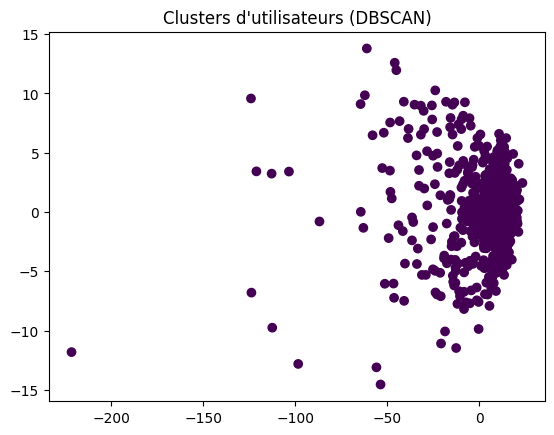

In [73]:
# Réduction de dimensionnalité pour visualisation
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_user_similarity)

# Plot des clusters
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=user_clusters, cmap='viridis')
plt.title('Clusters d\'utilisateurs (DBSCAN)')
plt.show()

Choisir DBSCAN car il est efficace pour identifier des clusters denses de points similaires, même dans des formes irrégulières, et il est capable de détecter des outliers ou utilisateurs atypiques.

1- Standardiser les données de similarité entre utilisateurs pour les rendre comparables.
2- DBSCAN regroupe les utilisateurs en clusters basés sur la densité, ce qui signifie que les utilisateurs ayant des préférences similaires sont regroupés ensemble. Les utilisateurs qui ne se ressemblent pas à un certain nombre de voisins sont considérés comme du bruit.
3- l'algorithme n'a pas trouvé de groupes distincts dans les données, ce qui suggère que nos utilisateurs n'ont pas de comportements similaires qui permettent de les regrouper facilement avec cette méthode.
4- Cela pourrait indiquer que nos utilisateurs ont des préférences très variées, ou que les paramètres de l'algorithme nécessitent des ajustements. Une autre possibilité est que nous devions essayer une méthode de clustering différente.

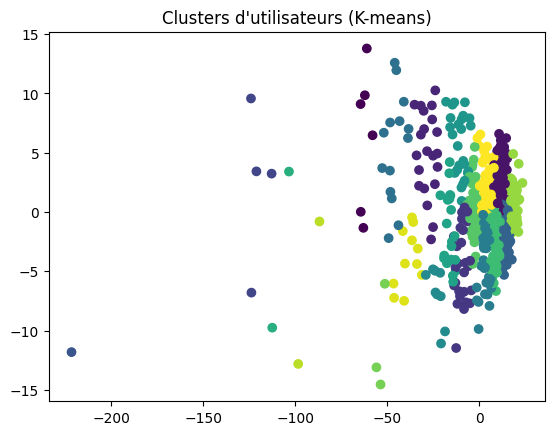

In [74]:
# Définir le nombre de clusters
k = 20  # ou un autre nombre selon votre choix

# Appliquer K-means
kmeans = KMeans(n_clusters=k, random_state=42)
user_clusters_kmeans = kmeans.fit_predict(scaled_user_similarity)

# Réduction de dimensionalité pour visualisation (facultatif)
pca = PCA(n_components=2)
reduced_data_kmeans = pca.fit_transform(scaled_user_similarity)

# Plot des clusters
plt.scatter(reduced_data_kmeans[:, 0], reduced_data_kmeans[:, 1], c=user_clusters_kmeans, cmap='viridis')
plt.title('Clusters d\'utilisateurs (K-means)')
plt.show()


Chaque point représente un utilisateur. La couleur du point montre à quel groupe cet utilisateur appartient. Il y a trois couleurs différentes, cela signifie que les utilisateurs ont été regroupés en trois groupes.

Les utilisateurs dans un même groupe (même couleur) partagent des goûts ou comportements similaires.
